In [3]:
#Not all these packages are required but they are here for completeness
import importlib
import io
import matplotlib.pyplot as plt
import numpy as np
import os
import openslide
from openslide import open_slide
from pathlib import Path
import pandas as pd
from PIL import Image, ImageOps, ImageChops, ImageDraw
import SimpleITK as sitk
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_holes
import staintools
from staintools.stain_extraction.macenko_stain_extractor import MacenkoStainExtractor
from staintools.stain_extraction.vahadane_stain_extractor import VahadaneStainExtractor
from staintools.miscellaneous.optical_density_conversion import convert_OD_to_RGB
from staintools.miscellaneous.get_concentrations import get_concentrations
import cv2 as cv
from staintools.preprocessing.input_validation import is_uint8_image
import sys


Image.MAX_IMAGE_PIXELS = None

In [4]:
from staintools import stain_normalizer
from staintools import LuminosityStandardizer as LS

In [5]:
class StainNormalizer(object):

    def __init__(self, method):
        if method.lower() == 'macenko':
            self.extractor = MacenkoStainExtractor
        elif method.lower() == 'vahadane':
            self.extractor = VahadaneStainExtractor
        else:
            raise Exception('Method not recognized.')

    def fit(self, target):
        """
        Fit to a target image.
        :param target: Image RGB uint8.
        :return:
        """
        self.stain_matrix_target = self.extractor.get_stain_matrix(target)
        self.target_concentrations = get_concentrations(target, self.stain_matrix_target)
        self.maxC_target = np.percentile(self.target_concentrations, 99, axis=0).reshape((1, 2))
        self.stain_matrix_target_RGB = convert_OD_to_RGB(self.stain_matrix_target)  # useful to visualize.
        
    def precompute(self, I):
        self.stain_matrix_source = self.extractor.get_stain_matrix(I)
        source_concentrations = get_concentrations(I, self.stain_matrix_source)
        self.maxC_source = np.percentile(source_concentrations, 99, axis=0).reshape((1, 2))

    def transform(self, I):
        """
        Transform an image.
        :param I: Image RGB uint8.
        :return:
        """
        stain_matrix_source = self.extractor.get_stain_matrix(I)
        source_concentrations = get_concentrations(I, stain_matrix_source)
        maxC_source = np.percentile(source_concentrations, 99, axis=0).reshape((1, 2))
        source_concentrations *= (self.maxC_target / maxC_source)
        tmp = 255 * np.exp(-1 * np.dot(source_concentrations, self.stain_matrix_target))
        return tmp.reshape(I.shape).astype(np.uint8)
    
    def transform_tile(self, I):
        source_concentrations = get_concentrations(I, self.stain_matrix_source)
        source_concentrations *= (self.maxC_target / self.maxC_source)
        tmp = 255 * np.exp(-1 * np.dot(source_concentrations, self.stain_matrix_target))
        return tmp.reshape(I.shape).astype(np.uint8)
    
class LuminosityStandardizer(object):
    
    def __init__(self):
        self.p = None
    
    @staticmethod
    def standardize(I, percentile=95):
        """
        Transform image I to standard brightness.
        Modifies the luminosity channel such that a fixed percentile is saturated.
        :param I: Image uint8 RGB.
        :param percentile: Percentile for luminosity saturation. At least (100 - percentile)% of pixels should be fully luminous (white).
        :return: Image uint8 RGB with standardized brightness.
        """
        assert is_uint8_image(I), "Image should be RGB uint8."
        I_LAB = cv.cvtColor(I, cv.COLOR_RGB2LAB)
        L_float = I_LAB[:, :, 0].astype(float)
        p = np.percentile(L_float, percentile)
        I_LAB[:, :, 0] = np.clip(255 * L_float / p, 0, 255).astype(np.uint8)
        I = cv.cvtColor(I_LAB, cv.COLOR_LAB2RGB)
        return I
    
    def fit(self, I, percentile = 95):
        assert is_uint8_image(I), "Image should be RGB uint8."
        I_LAB = cv.cvtColor(I, cv.COLOR_RGB2LAB)
        L_float = I_LAB[:, :, 0].astype(float)
        self.p = np.percentile(L_float, percentile)
#         return p
        
    def standardize_tile(self, I):
        I_LAB = cv.cvtColor(I, cv.COLOR_RGB2LAB)
        L_float = I_LAB[:, :, 0].astype(float)
        I_LAB[:, :, 0] = np.clip(255 * L_float / self.p, 0, 255).astype(np.uint8)
        I = cv.cvtColor(I_LAB, cv.COLOR_LAB2RGB)
        return I

In [6]:
# Import package 
BASE_DIR = Path().resolve()
HEMNET_DIR = BASE_DIR.parent.joinpath('HEMnet')

os.chdir(HEMNET_DIR)
from slide import *
from utils import *

In [7]:
import utils
importlib.reload(utils)
from utils import *

import slide
importlib.reload(slide)
from slide import *

In [8]:
# User Input parameters
SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005/')
#OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/train_dataset_10x_11_12_19_v3')
OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/17_12_19_testing')
TEMPLATE_SLIDE_PATH = Path('/gpfs1/scratch/90days/s4436005/2171_T_11524A_2_HandE.svs')


ALIGNMENT_MAG = 1
TILE_MAG = 5
VERBOSE = True

#Verbose functions
if VERBOSE:
    verbose_print = lambda *args: print(*args)
    verbose_save_img = lambda img, path, img_type: img.save(path, img_type)
    verbose_save_fig = lambda fig, path, dpi=300: fig.savefig(path, dpi=dpi)
else:
    verbose_print = lambda *args: None
    verbose_save_img = lambda *args: None
    verbose_save_fig = lambda *args: None

# Find Slides
slides = []
for slide in SLIDES_PATH.glob('*.svs'):
    name = slide.name
    slides.append(name)
slides.sort()
slides

['1820_N_10545A_2_HandE.svs',
 '1820_N_10545A_4_TP53.svs',
 '1820_T_105452F_2_HandE.svs',
 '1820_T_105452F_4_TP53.svs',
 '2065_N_12752A_2_HandE.svs',
 '2065_N_12752A_4_TP53.svs',
 '2065_T_12756A_2_HandE.svs',
 '2065_T_12756A_4_TP53.svs',
 '2112_N_12341B_2_HandE.svs',
 '2112_N_12341B_4_TP53.svs',
 '2112_T_12335F_2_HandE.svs',
 '2112_T_12335F_4_TP53.svs',
 '2148_N_11397A_2_HandE.svs',
 '2148_N_11397A_4_TP53.svs',
 '2148_T_11393A_2_HandE.svs',
 '2148_T_11393A_4_TP53.svs',
 '2171_N_11521A_2_HandE.svs',
 '2171_N_11521A_4_TP53.svs',
 '2171_T_11524A_2_HandE.svs',
 '2171_T_11524A_4_TP53.svs']

In [9]:
TP53_slides = [slide for slide in slides if 'TP53' in slide]
HE_slides = [slide for slide in slides if 'HandE' in slide]
Paired_slides = list(zip(TP53_slides, HE_slides))
Paired_slides

[('1820_N_10545A_4_TP53.svs', '1820_N_10545A_2_HandE.svs'),
 ('1820_T_105452F_4_TP53.svs', '1820_T_105452F_2_HandE.svs'),
 ('2065_N_12752A_4_TP53.svs', '2065_N_12752A_2_HandE.svs'),
 ('2065_T_12756A_4_TP53.svs', '2065_T_12756A_2_HandE.svs'),
 ('2112_N_12341B_4_TP53.svs', '2112_N_12341B_2_HandE.svs'),
 ('2112_T_12335F_4_TP53.svs', '2112_T_12335F_2_HandE.svs'),
 ('2148_N_11397A_4_TP53.svs', '2148_N_11397A_2_HandE.svs'),
 ('2148_T_11393A_4_TP53.svs', '2148_T_11393A_2_HandE.svs'),
 ('2171_N_11521A_4_TP53.svs', '2171_N_11521A_2_HandE.svs'),
 ('2171_T_11524A_4_TP53.svs', '2171_T_11524A_2_HandE.svs')]

In [10]:
#Load and fit template slide
template_slide = open_slide(str(TEMPLATE_SLIDE_PATH))
template = read_slide_at_mag(template_slide, ALIGNMENT_MAG)

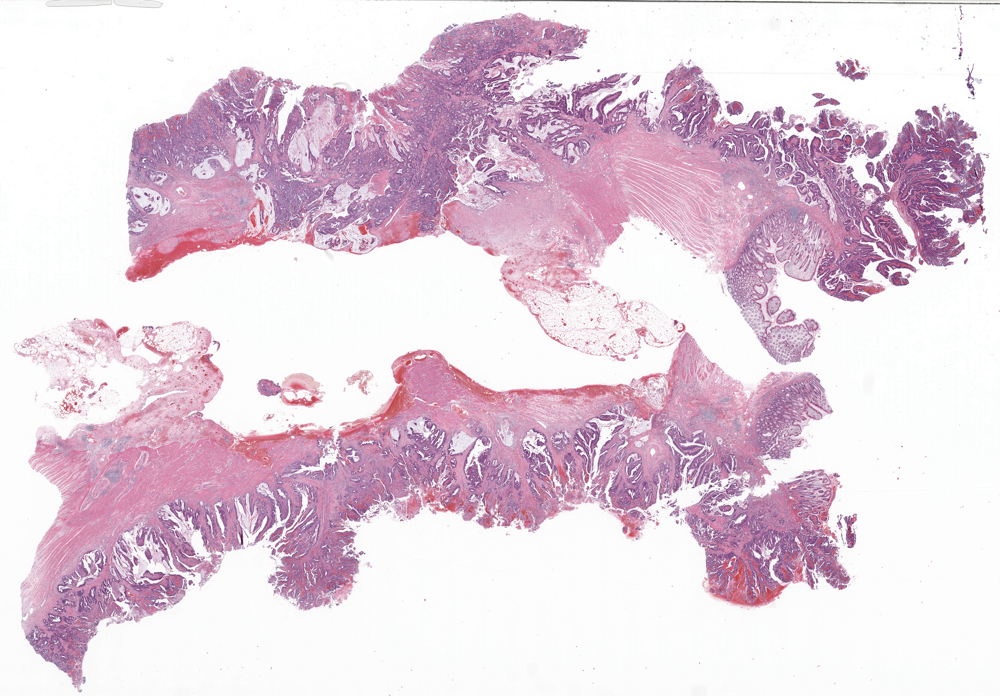

In [11]:
normaliser = StainNormalizer(method='vahadane')
normaliser_og = staintools.StainNormalizer(method='vahadane')
template_std = LuminosityStandardizer.standardize(np.array(template))
template_std_og = LS.standardize(np.array(template))
normaliser.fit(template_std)
normaliser_og.fit(template_std_og)
thumbnail(Image.fromarray(template_std))

In [12]:
template_tile_mag = read_slide_at_mag(template_slide, TILE_MAG)
normaliser_tile_mag = StainNormalizer(method='vahadane')
template_std_tile_mag = LuminosityStandardizer.standardize(np.array(template_tile_mag))
normaliser_tile_mag.fit(template_std_tile_mag)

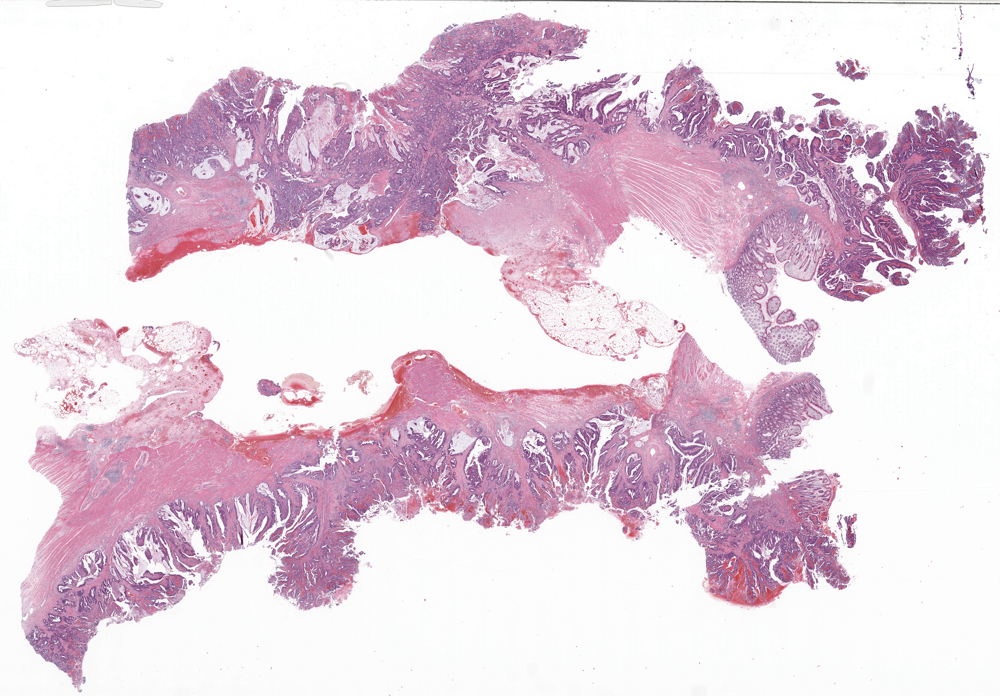

In [13]:
thumbnail(Image.fromarray(template_std_og))

In [14]:
SLIDE_NUM = 0
PREFIX = Paired_slides[SLIDE_NUM][0][:-8]
verbose_print('Processing Slide: {0}'.format(PREFIX))
tp53_name, he_name = Paired_slides[SLIDE_NUM]
tp53_slide = open_slide(str(SLIDES_PATH.joinpath(tp53_name)))
he_slide = open_slide(str(SLIDES_PATH.joinpath(he_name)))

Processing Slide: 1820_N_10545A_4_


In [15]:
#Load Slides
he = read_slide_at_mag(he_slide, ALIGNMENT_MAG)
tp53 = read_slide_at_mag(tp53_slide, ALIGNMENT_MAG)

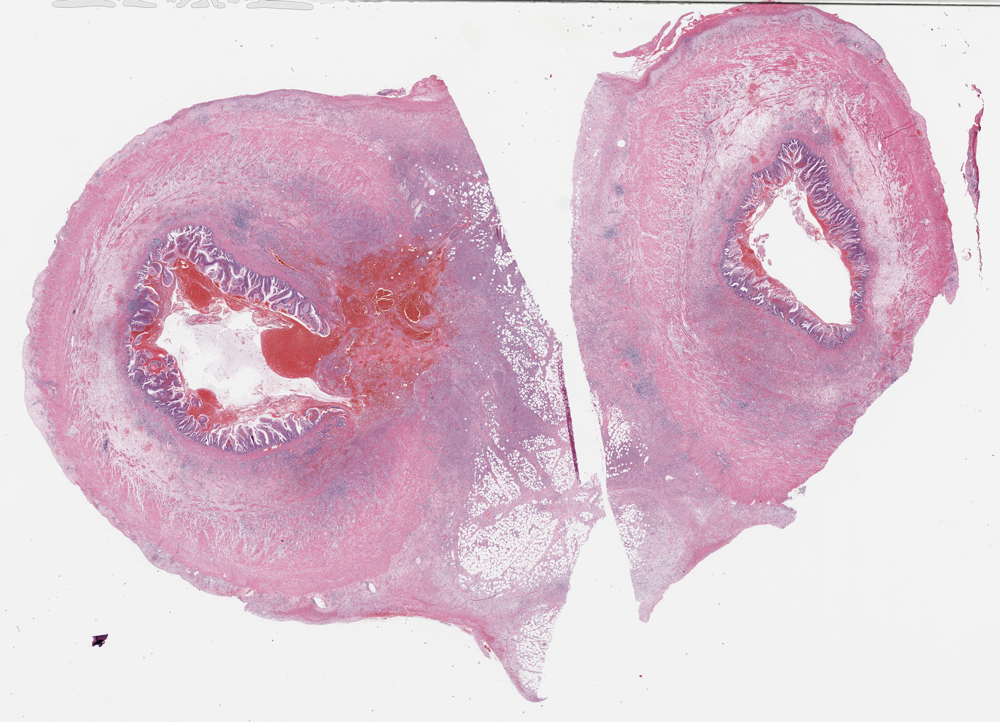

In [16]:
thumbnail(he)

In [17]:
#Normalise H&E Slide
he_std = LuminosityStandardizer.standardize(np.array(he))
he_std_og = LS.standardize(np.array(he))
he_transformed = normaliser.transform(he_std)
he_transformed_og = normaliser_og.transform(he_std_og)
he_norm_small = Image.fromarray(he_transformed)
he_norm_small_og = Image.fromarray(he_transformed_og)

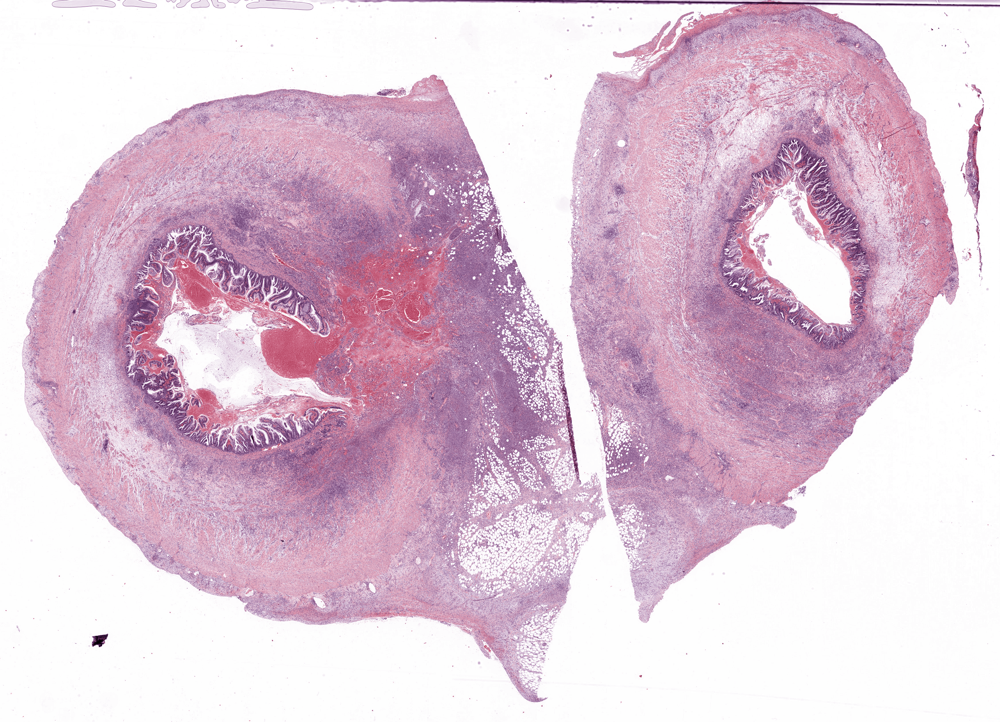

In [18]:
thumbnail(he_norm_small)

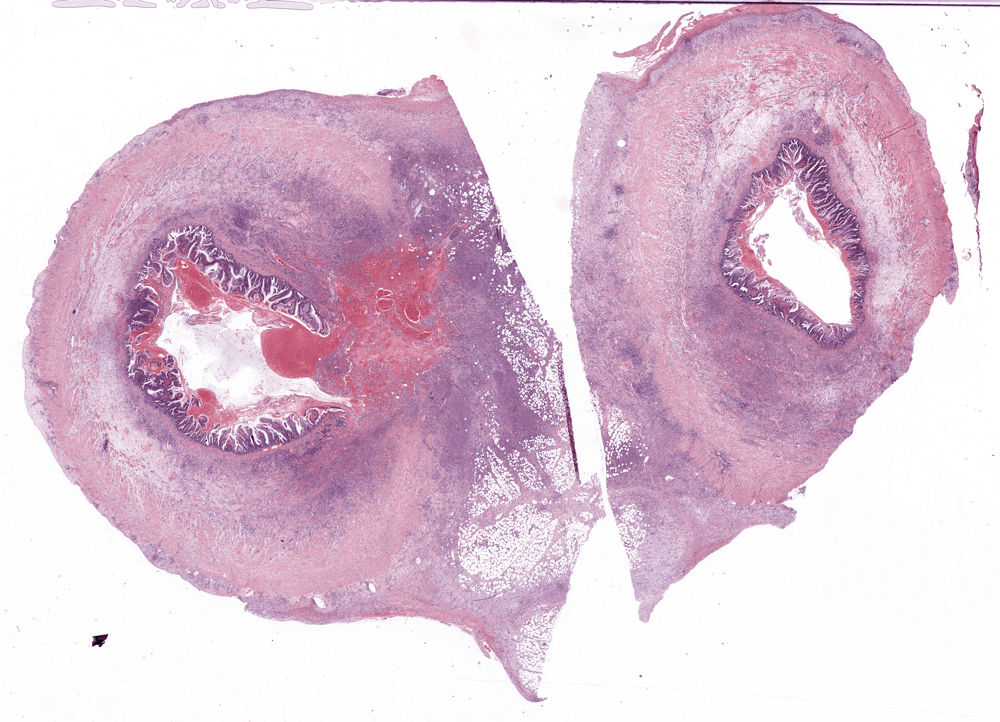

In [19]:
thumbnail(he_norm_small_og)

In [20]:
tile_size = 299*ALIGNMENT_MAG/TILE_MAG

In [21]:
LumStd = LuminosityStandardizer()
LumStd.fit(np.array(he.convert('RGB')))
normaliser.precompute(np.array(he_std))
tgen = tile_gen_at_mag(he_slide, TILE_MAG, 299)

In [22]:
tgen = tile_gen_at_mag(he_slide, TILE_MAG, 299)
tgen_small = tile_gen(he_norm_small, tile_size)
tgen_small_og = tile_gen(he_norm_small, tile_size)

In [23]:
tiles_mag = []
tiles_small = []
tiles_small_og = []
for i in range(200):
    tiles_mag.append(next(tgen))
    tiles_small.append(next(tgen_small))
    tiles_small_og.append(next(tgen_small_og))

In [24]:
he_tile_mag = read_slide_at_mag(he_slide, TILE_MAG)
he_std_tile_mag = LuminosityStandardizer.standardize(np.array(he_tile_mag))
he_transformed_tile_mag = normaliser.transform(he_std_tile_mag)
he_norm_tile_mag = Image.fromarray(he_transformed_tile_mag)

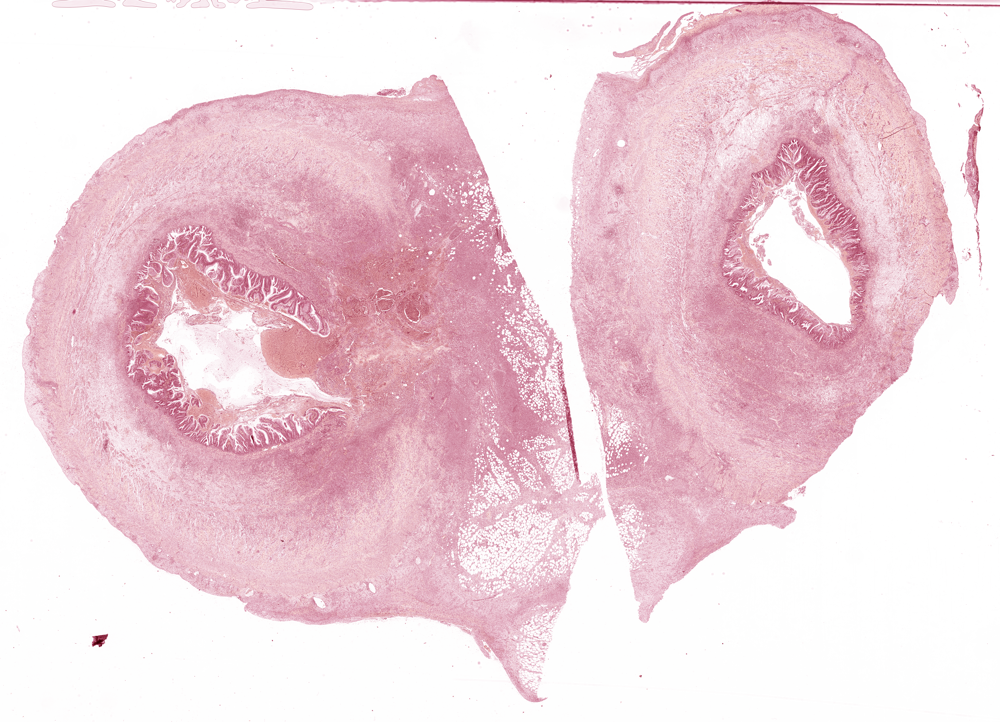

In [25]:
thumbnail(Image.fromarray(normaliser_tile_mag.transform(he_std_tile_mag)))

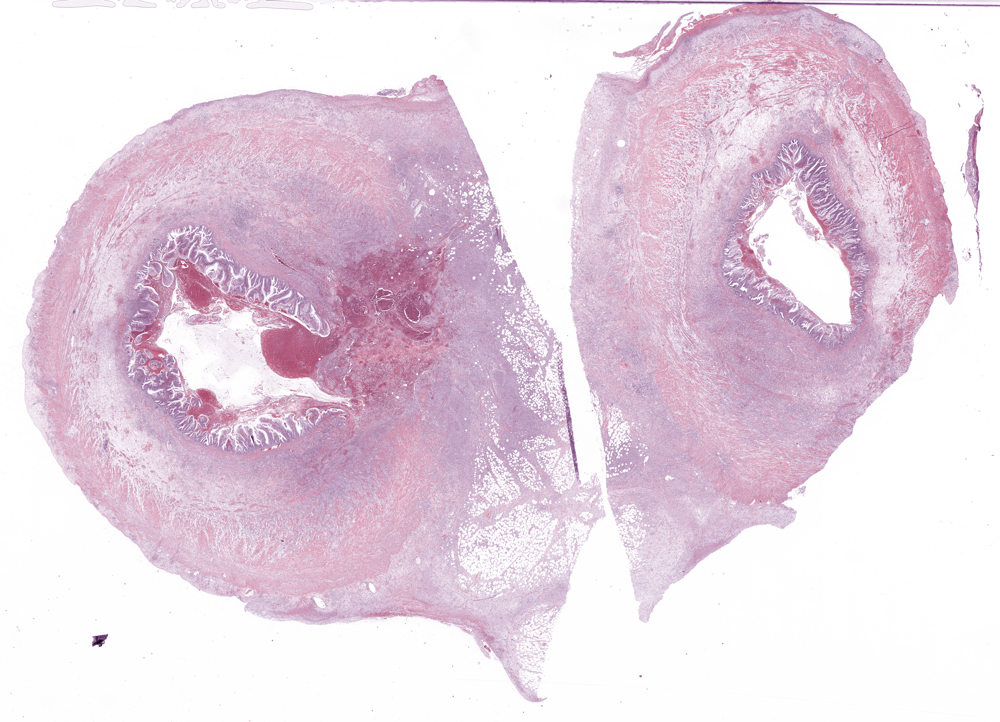

In [26]:
thumbnail(he_norm_tile_mag)

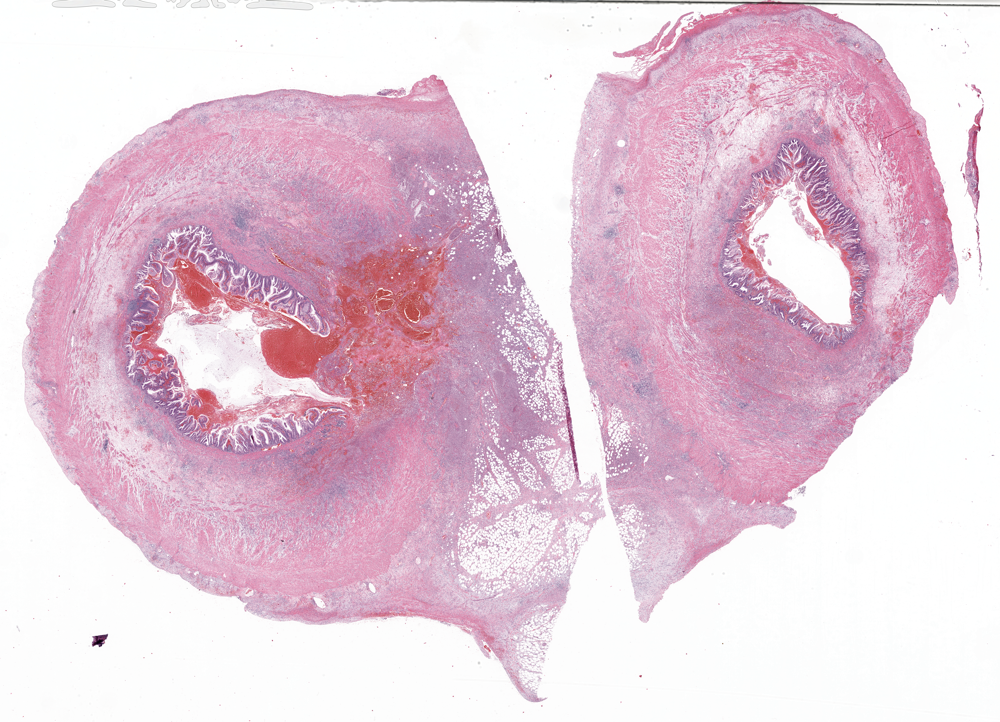

In [27]:
thumbnail(Image.fromarray(he_std_tile_mag))

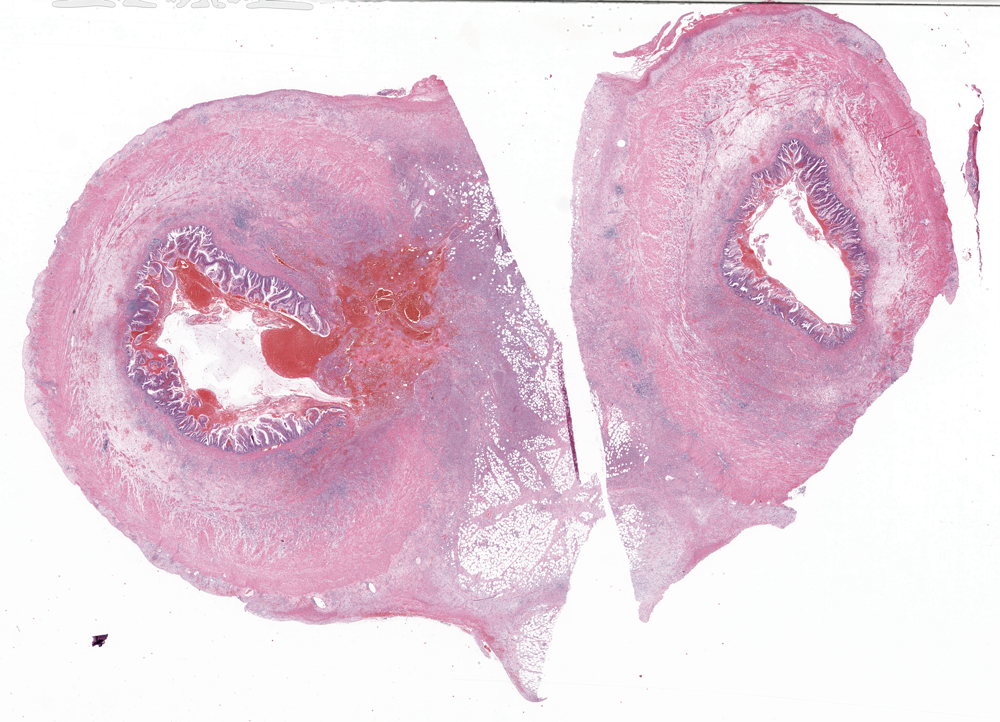

In [28]:
thumbnail(Image.fromarray(he_std))

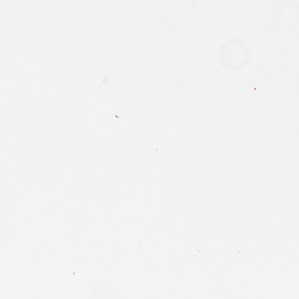

In [29]:
tiles_mag[72]

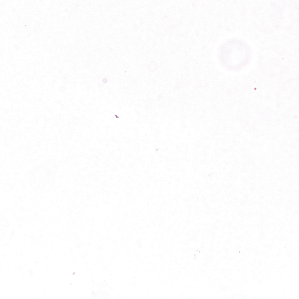

In [30]:
tile_np = np.array(tiles_mag[72].convert('RGB'))
tile_std = LumStd.standardize_tile(tile_np)
tile_norm = normaliser.transform_tile(tile_std)
Image.fromarray(tile_norm)

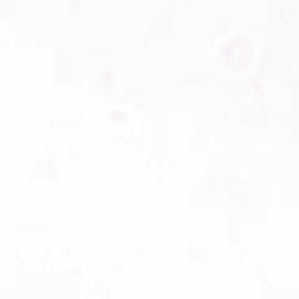

In [31]:
tiles_small_og[72].resize((299,299), Image.BICUBIC)

In [32]:
tgen_small = tile_gen(he_norm_small, 299)

In [33]:
next(tgen_small)

(9, 6)

## Testing tile output

In [116]:
def save_train_tiles(path, tile_gen, cancer_mask, tissue_mask, standardiser, prefix = ''):
    os.makedirs(TILES_PATH.joinpath('cancer'), exist_ok = True)
    os.makedirs(TILES_PATH.joinpath('non-cancer'), exist_ok = True)
    x_tiles, y_tiles = next(tile_gen)
    verbose_print('Whole Image Size is {0} x {1}'.format(x_tiles, y_tiles))
    i = 0 
    for tile in tile_gen:
        img = tile.convert('RGB')
        ###
        img_np = np.array(img)
        img_std = standardiser.standardize_tile(img_np)
        img_norm = Image.fromarray(normaliser.transform_tile(img_std))
        ###
        #Name tile as horizontal position _ vertical position starting at (0,0)
        tile_name = prefix + str(np.floor_divide(i,x_tiles)) + '_' +  str(i%x_tiles) 
        if cancer_mask.ravel()[i] == 0:
            img_norm.save(path.joinpath('cancer', tile_name + '.jpeg'), 'JPEG')
        elif tissue_mask.ravel()[i] == 0:
            img_norm.save(path.joinpath('non-cancer', tile_name + '.jpeg'), 'JPEG')
        i += 1
    verbose_print('Exported tiles for {0}'.format(prefix))

In [128]:
tgen = tile_gen_at_mag(he_slide, ALIGNMENT_MAG, 299)

In [130]:
wsi_tile_size

(18, 13)

In [131]:
c_mask_filtered = np.zeros(wsi_tile_size)
t_mask = np.zeros(wsi_tile_size)

In [132]:
TILES_PATH = OUTPUT_PATH.joinpath('tiles_2x')

In [133]:
LumStd = LuminosityStandardizer()
LumStd.fit(np.array(he.convert('RGB')))
normaliser.precompute(np.array(he_std))
tgen = tile_gen_at_mag(he_slide, ALIGNMENT_MAG, 299)
save_train_tiles(TILES_PATH, tgen, c_mask_filtered, t_mask, LumStd, prefix = PREFIX)

Whole Image Size is 18 x 13
Exported tiles for 1820_N_10545A_4_


In [147]:
LumStd.fit(np.zeros((10,10,3)).astype(np.uint8))

In [143]:
LumStd.p

0.0

In [149]:
normaliser.maxC_source

array([[0., 0.]])

In [148]:
normaliser.precompute(np.ones((10,10,3)).astype(np.uint8))